# Build a Long/Short Pairs Portfolio to maximum the PnL

1.   Base on **stocksInfo** and **researchData** to **identify  Pairs** and calculate **trading parameters**. 
2.   Based on **testData** to **backtest** the Pairs portfolio with **signals** and **dollarValue**
3.   Calculate the **PnL** of the backtested Pairs portfolio



# Rules
 

*   **No lookahead bias**: The testData cannot be used for Pairs identification nor the trading parameters calculations
*   **No overfitting**: The Pairs cannot be hand-picked and must be based on rules. Similarly for the trading parameters and dollarValue, apart from the obvious numbers (e.g. 0.05, 0.1, 0.5, 1, 100, 1000 etc.), they must be based on rules also.

In [1]:
import numpy as np
import pairslib
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from itertools import combinations, product
from math import erf
from matplotlib.dates import DateFormatter
from numpy.lib.scimath import sqrt
from pykalman import KalmanFilter
from scipy.optimize import fmin
from scipy.stats import kstest, norm, t
from statsmodels.graphics.gofplots import qqplot
from statsmodels.regression.linear_model import OLS
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import VECM, coint_johansen

%matplotlib inline

researchData = pd.read_csv('https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/researchHKStocksAdjClosePx.csv', index_col=0)
testData = pd.read_csv('https://raw.githubusercontent.com/kenwkliu/ideas/master/colab/data/testHKStocksAdjClosePx.csv', index_col=0)


In [2]:
# Implement your logic to construct "pairsPortfolioBackTest"
# pairsPortfolioBackTest needs to be same format as in https://colab.research.google.com/github/kenwkliu/ideas/blob/master/colab/HKStocksCorrelation.ipynb
# It is a list of backtested Pairs
# Each backtested Pairs is a dataframe with at least 5 columns (Date, stockA, stockB, signal, dollarValue)

# signal is -1, 0, 1
# signal == -1: Long stockA Short stockB
# signal == 1: Short stockA Long stockB
# signal == 0: flat position

In [3]:
# Calcuate the PnL of the Pairs portfolio
#pnl, pnlDf = pairslib.calcPortfolio(pairsPortfolioBackTest)
#pnlDf

In [4]:
stocksInfo.head()

,code,shortName,industry,sector,language,region,quoteType,quoteSourceName,triggerable,currency,...,tradeable,price,earningsTimestamp,earningsTimestampStart,earningsTimestampEnd,trailingPE,epsTrailingTwelveMonths,epsForward,forwardPE,dividendDate
0,4333.HK,CISCO-T,Information Technology,Telecommunications Equipment,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4335.HK,INTEL-T,Information Technology,Semi-conductor,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,300.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4338.HK,MICROSOFT-T,Information Technology,Technology and Software,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9988.HK,BABA-SW,Information Technology,E-commerce and Internet,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,248.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0700.HK,TENCENT,Information Technology,Online and Mobile Games,en-US,US,EQUITY,Delayed Quote,False,HKD,...,False,548.0,1.597216e+09,1.597216e+09,1.597216e+09,49.754498,11.01408,10.94,50.091408,NaN


In [5]:
'''
Delete days where all data is NaN (public holiday?)
'''


for date in reversed(researchData.index):
    if all(np.isnan(researchData.loc[date])):
        researchData = researchData.drop(date, axis=0)

researchData.head()

,BABA-SW,TENCENT,CCB,MEITUAN-W,CHINA MOBILE,AIA,HSBC HOLDINGS,PING AN,HKEX,ICBC,...,HKTV,COMEC,EB SECURITIES,CHINA DONGXIANG,FLAT GLASS,HEC PHARM,BROAD HOMES,FI2 CSOP HSI,FL2 CSOP HSI,LINK REIT
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,210.000000,380.297546,6.011992,103.500000,57.697662,82.010986,58.445934,87.541428,249.938675,5.350135,...,3.434652,5.812789,6.312775,0.776677,5.291602,21.673248,8.035072,6.12,10.40,77.429619
2020-01-03,212.000000,380.894257,5.941263,104.199997,56.858910,82.495110,57.966084,88.242493,255.889633,5.305920,...,3.394945,5.803052,6.341688,0.776677,5.281712,20.329361,7.978421,6.17,10.32,76.912170
2020-01-06,211.000000,375.325012,5.879375,109.500000,56.726471,81.623695,57.582199,87.728371,257.809265,5.244017,...,3.385018,5.841999,6.360963,0.758823,5.271821,20.280495,7.761257,6.27,10.16,76.347679
2020-01-07,212.600006,383.479980,5.844010,110.400002,56.329166,82.591942,57.486233,87.494682,258.961060,5.226330,...,3.533919,5.793315,6.360963,0.758823,5.637782,20.329361,7.695163,6.24,10.18,76.206551
2020-01-08,210.800003,379.899750,5.799804,106.400002,56.373310,81.139565,56.910408,86.419678,257.425354,5.164428,...,3.504139,6.114626,6.148932,0.758823,5.637782,20.036150,7.685722,6.33,10.04,75.924301


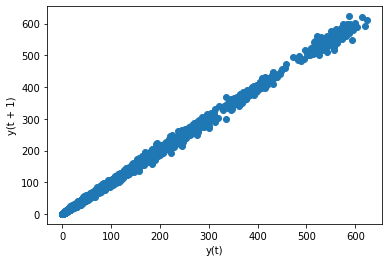

In [6]:
'''
Plotting close price against its previous close.
Linear relationship indicate stocks are I(1) series, therefore may cointegrate with each other
'''

pd.plotting.lag_plot(researchData, lag=1)

In [7]:
'''
Normalise stock price
'''

normalised_researchData = pd.DataFrame()

for stock in researchData.columns:
    normalised_researchData[stock] = researchData[stock]/researchData[stock][0]
    
normalised_researchData.head()

,BABA-SW,TENCENT,CCB,MEITUAN-W,CHINA MOBILE,AIA,HSBC HOLDINGS,PING AN,HKEX,ICBC,...,HKTV,COMEC,EB SECURITIES,CHINA DONGXIANG,FLAT GLASS,HEC PHARM,BROAD HOMES,FI2 CSOP HSI,FL2 CSOP HSI,LINK REIT
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2020-01-03,1.009524,1.001569,0.988235,1.006763,0.985463,1.005903,0.991790,1.008008,1.023810,0.991736,...,0.988439,0.998325,1.004580,1.000000,0.998131,0.937993,0.992949,1.008170,0.992308,0.993317
2020-01-06,1.004762,0.986925,0.977941,1.057971,0.983168,0.995278,0.985222,1.002135,1.031490,0.980165,...,0.985549,1.005025,1.007634,0.977012,0.996262,0.935739,0.965923,1.024510,0.976923,0.986027
2020-01-07,1.012381,1.008368,0.972059,1.066667,0.976282,1.007084,0.983580,0.999466,1.036098,0.976859,...,1.028902,0.996650,1.007634,0.977012,1.065421,0.937993,0.957697,1.019608,0.978846,0.984204
2020-01-08,1.003810,0.998954,0.964706,1.028019,0.977047,0.989374,0.973727,0.987186,1.029954,0.965289,...,1.020231,1.051926,0.974046,0.977012,1.065421,0.924465,0.956522,1.034314,0.965385,0.980559


In [8]:
'''
Calculate the normalised price difference between stocks
The motivation here is to filter out potential cointegrated pairs
If the normalised price differnce is small, it should indicate cointegration relationship
Otherwise, it will take (173C2=14878) iterations of adf tests to test for cointegration


Here, I made a critical mistake of lookahead bias, since future stock prices are used in calculating NPD,
which makes my strategy fail (see below)

''' 

npd_df = pd.DataFrame(columns=researchData.columns, index=researchData.columns, dtype="float").fillna(0)

for pair in product(normalised_researchData.columns, repeat=2):
    npd = ((normalised_researchData[pair[0]]-normalised_researchData[pair[1]])**2).sum()
    npd_df[pair[0]][pair[1]] = npd
               
npd_df.style.background_gradient(cmap='binary')

In [9]:
'''
Filter out the top 10% pair with lowest NPD for adf test
'''

npd_df[npd_df == 0] = np.NaN
npd_threshold = np.nanquantile(npd_df, 0.1)

possibly_cointegrated_pairs = []

for pair1_idx in range(len(npd_df)):
    for pair2_idx in range(pair1_idx+1, len(npd_df)):
        if npd_df.iloc[pair1_idx, pair2_idx] <= npd_threshold:
            possibly_cointegrated_pairs.append((npd_df.columns[pair1_idx], npd_df.columns[pair2_idx]))

len(possibly_cointegrated_pairs)

1454

In [10]:
'''
For the remaining potentially cointegrated pairs filtered with normalised price differnce,
perform the formal adf test for stationarity on the regression residuals. If the residuals are stationary,
it indicates the pair is cointegrated.
'''

possibly_cointegrated_pairs_p_value_dict = {}

for pair in possibly_cointegrated_pairs:
    
    pair1 = pair[0]
    pair2 = pair[1]
    
    ols = OLS(researchData[pair1], sm.add_constant(researchData[pair2].to_numpy()), missing="drop").fit()
    intercept = ols.params[0]
    slope = ols.params[1]
    residuals = researchData[pair1] - (intercept + slope * researchData[pair2])
    
    adf = adfuller(residuals[~np.isnan(residuals)])
    p_value = adf[1]
        
    possibly_cointegrated_pairs_p_value_dict[pair] = p_value
    possibly_cointegrated_pairs_p_value_dict = dict(sorted(possibly_cointegrated_pairs_p_value_dict.items(),
                                                           key=lambda item: item[1]))

possibly_cointegrated_pairs_p_value_dict

{('WYNN MACAU', 'SINOPHARM'): 9.066381620836904e-05,
 ('CLP HOLDINGS', 'CHINA SHENHUA'): 0.00016368612469098057,
 ('CLP HOLDINGS', 'MINSHENG BANK'): 0.00019871569251045254,
 ('CHINA VANKE', 'GAC GROUP'): 0.00021738165318808817,
 ('WEICHAI POWER', 'CGS'): 0.0003883818321458153,
 ('AIA', 'LENOVO GROUP'): 0.0004654614499663506,
 ('CITIC BANK', 'PICC P&C'): 0.0006085227793863894,
 ('CLP HOLDINGS', 'CITIC SEC'): 0.0007752562115371454,
 ('CNOOC', 'SINOPHARM'): 0.0008708599900003894,
 ('AIR CHINA', 'GAC GROUP'): 0.0008715849416582446,
 ('COUNTRY GARDEN', 'KUNLUN ENERGY'): 0.0008777191235660787,
 ('CLP HOLDINGS', 'CHINA RES GAS'): 0.0009145305973924428,
 ('CHINA TAIPING', 'PICC GROUP'): 0.001021172609424639,
 ('WEICHAI POWER', 'NCI'): 0.001137649827527394,
 ('CLP HOLDINGS', 'WEICHAI POWER'): 0.001335292155910672,
 ('BRILLIANCE CHI', 'HTSC'): 0.0013405848534446866,
 ('CHINA TAIPING', 'ASM PACIFIC'): 0.001362496831301868,
 ('NEWWORLDDEV-NEW', 'KUNLUN ENERGY'): 0.001368968190806352,
 ('WH GROUP',

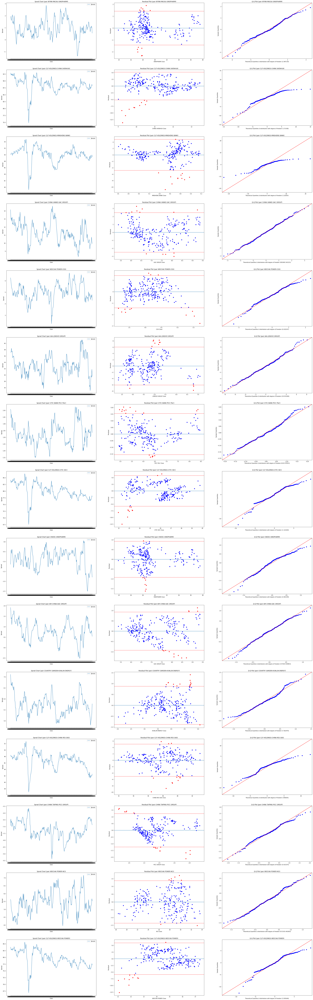

In [11]:
'''
Some visualisation of the cointegrated pairs with lowest p-values
Q-Q plots are compared against normal distributions
'''


fig, axs = plt.subplots(15,3, figsize=(45,150))

for i, pair in enumerate(list(possibly_cointegrated_pairs_p_value_dict)[:15]):
    
    pair1 = pair[0]
    pair2 = pair[1]

    ols = OLS(researchData[pair1], sm.add_constant(researchData[pair2].to_numpy()), missing="drop").fit()
    intercept = ols.params[0]
    slope = ols.params[1]
    spread = researchData[pair1] - slope * researchData[pair2]
    
    axs[i,0].plot(spread, label="Spread")
    axs[i,0].legend()
    axs[i,0].set_xlabel("Date")
    axs[i,0].set_ylabel("Spread")
    axs[i,0].set_title("Sprad Chart (pair %s-%s)" % (pair1, pair2))
    
    residuals = researchData[pair1] - (intercept + slope * researchData[pair2])
    std = np.nanstd(residuals)
    upper_bound = 2*std
    lower_bound = -2*std
    colors = np.where((lower_bound <= residuals) & (residuals <= upper_bound), "blue", "red")
    
    axs[i,1].axhline(y=0, linestyle="-")
    axs[i,1].axhline(y=upper_bound, linestyle="--", color="red")
    axs[i,1].axhline(y=lower_bound, linestyle="--", color="red")    
    axs[i,1].scatter(researchData[pair2], residuals, color=colors)
    axs[i,1].set_xlabel("%s Close" % pair2)
    axs[i,1].set_ylabel("Residual")
    axs[i,1].set_title("Residual Plot (pair %s-%s)" % (pair1, pair2))
    
    degrees_of_freedom = t.fit(residuals[np.isfinite(residuals)])[0]
    qqplot(residuals[np.isfinite(residuals)], t, distargs=(degrees_of_freedom,), 
           line="45", scale=std, ax=axs[i,2])
    axs[i,2].set_xlabel("Theoretical Quantiles (t-distribution with degree of freedom %2f)" % degrees_of_freedom)
    axs[i,2].set_title("Q-Q Plot (pair %s-%s)" % (pair1, pair2))
    

In [144]:
'''
The objective of function below is to determine the optimal trading threshold s_0.
Assume the spread follow a normal distribution, and we hold the position until the spread restores to 0
The profit of each successful trade is s_0. The probability of triggering a long/short position is (1-F(s_0)),
where F(x) is the cdf of normal
Therefore, we should choose s_0 such that s_0(1-F(s_0)) is maximised
The estimator of mean and std are computed with rolling window of 30, and unbiased estimator are used
'''


def get_optimal_trading_threshold(spread_arr, window=30):
    
    def norm_cdf(z):
        return (1.0 + erf(z/sqrt(2.0))) / 2.0
    
    lower_threshold_arr = []
    upper_threshold_arr = []
    
    for date in range(len(spread_arr)):
        
        if date < window:
            lower_threshold_arr.append(0.0)
            upper_threshold_arr.append(0.0)
            continue
    
        mean = np.mean(spread_arr[date+1-window:date+1])
        std = np.std(spread_arr[date+1-window:date+1], ddof=1)

        max_z = fmin(lambda z: -z*(1-norm_cdf(z)), 0, disp=False)[0]
        lower_threshold_arr.append(mean-max_z*std)
        upper_threshold_arr.append(mean+max_z*std)
    
    return lower_threshold_arr, upper_threshold_arr

In [233]:
'''
The function calculates the cumulative PnL of a specific pair throughout the period
'''

def getCumPnl(pairs_df, suppress_output=False):
    
    pairs_df_copy = pairs_df.copy()
    stockA = pairs_df_copy.columns[1]
    stockB = pairs_df_copy.columns[2]
        
    pairs_df_copy["returnA"] = pairs_df[stockA].pct_change()
    pairs_df_copy["returnB"] = pairs_df[stockB].pct_change()
        
    cum_pnl = {pairs_df_copy.Date[0]: 0.0}
    
    for date in range(len(pairs_df_copy)-1):
        
        signal = pairs_df_copy.iloc[date].signal
        dollarValue = pairs_df_copy.iloc[date].dollarValue
        
        if signal < 0: 
            daily_pnl = dollarValue * (pairs_df_copy.iloc[date+1].returnA - pairs_df_copy.iloc[date+1].returnB)
            cum_pnl[pairs_df_copy.Date[date]] = list(cum_pnl.values())[-1] + daily_pnl
        elif signal > 0:
            daily_pnl = dollarValue * (pairs_df_copy.iloc[date+1].returnB - pairs_df_copy.iloc[date+1].returnA)
            cum_pnl[pairs_df_copy.Date[date]] = list(cum_pnl.values())[-1] + daily_pnl
        elif signal == 0:
            cum_pnl[pairs_df_copy.Date[date]] = list(cum_pnl.values())[-1]
            continue
    if not suppress_output:        
        print("Cumulative P/L for pair %s-%s: %d" % (stockA, stockB, list(cum_pnl.values())[-1]))
    
    return cum_pnl

In [249]:
'''
unfinished
'''

def getPortfolioPnl(pairs_list, close_df=researchData, show_plot=False):
    
    cum_pnl_list = []
    portfolio_cum_pnl = {close_df.index[0]: 0.0}
    for pairs in pairs_list:
        cum_pnl_list.append(getCumPnl(pairs))
    
    for date in close_df.index:
        total_daily_pnl = 0.0
        for cum_pnl in cum_pnl_list:
            if date in cum_pnl:
                total_daily_pnl += cum_pnl[date]
        portfolio_cum_pnl[date] = total_daily_pnl
    
    return portfolio_cum_pnl, cum_pnl_list
    

In [226]:
'''
The function below backtests the strategy with a specific pair.
Here, Kalman filter is initially set up, and is updated each day.
If the spread suggested by the Kalman filter exceeds the optimal upper threshold, it indicates stockA is overpriced
relative to stockB. Therefore, we should short stockA and long shortB (signal=1), vice versa.
The output pairs_df is in the required format of pairslib.
'''

def backtest_pair(pair_to_backtest, close_df=researchData, window=30, suppress_output=False, show_plot=False):
    
    stockA = pair_to_backtest[0]
    stockB = pair_to_backtest[1]
    pairs_df = close_df[[stockA, stockB]].dropna(axis=0)
    
    n = pairs_df.shape[0]
    n_dim_state = 2

    history_state_means = np.zeros((n, n_dim_state))
    history_state_covs = np.zeros((n, n_dim_state, n_dim_state))
    
    for idx, row in enumerate(pairs_df.itertuples(index=False)):

        if idx == 0:
            delta = 1e-3
            trans_cov = delta / (1 - delta) * np.eye(2)

            obs_mat = [pairs_df.iloc[0,1], 1]

            kf = KalmanFilter(n_dim_obs=1, n_dim_state=2,
                              initial_state_mean=np.zeros(2),
                              initial_state_covariance=np.ones((2, 2)),
                              transition_matrices=np.eye(2),
                              observation_matrices=obs_mat,
                              observation_covariance=1.0,
                              transition_covariance=trans_cov)

            history_state_means[0], history_state_covs[0] = kf.filter(np.asarray(pairs_df.iloc[0,0]))

        else:
            obs_mat = np.asarray([[pairs_df.iloc[idx,1], 1]])

            history_state_means[idx], history_state_covs[idx] = \
                kf.filter_update(history_state_means[idx-1],
                                 history_state_covs[idx-1],
                                 observation = pairs_df.iloc[idx,0],
                                 observation_matrix=obs_mat)
            
    pairs_df["slope"] = history_state_means[:,0]
    pairs_df["intercept"] = history_state_means[:,1]
    pairs_df["spread"] = pairs_df.iloc[:,0]-(pairs_df["intercept"] + pairs_df["slope"]*pairs_df.iloc[:,1])
                                
    spread = pairs_df.spread
    lower_threshold, upper_threshold = get_optimal_trading_threshold(spread, window)
    pairs_df["lower_threshold"] = lower_threshold
    pairs_df["upper_threshold"] = upper_threshold
        
    signal = []

    for date in range(len(pairs_df)):
        if date < window:
            signal.append(0)
            continue
        if pairs_df.iloc[date].spread > pairs_df.iloc[date].upper_threshold:
            signal.append(1)
        elif pairs_df.iloc[date].spread < pairs_df.iloc[date].lower_threshold:
            signal.append(-1)
        elif pairs_df.iloc[date].spread < 0 and signal[-1] == 1:
            signal.append(0)
        elif pairs_df.iloc[date].spread > 0 and signal[-1] == -1:
            signal.append(0)
        else:
            signal.append(signal[-1])

    pairs_df["signal"] = signal
    pairs_df["dollarValue"] = np.full(len(pairs_df), 10000)
    pairs_df["Date"] = pairs_df.index
    pairs_df = pairs_df.reset_index(drop="True")
    pairs_df = pairs_df[pairs_df.columns.tolist()[-1:] + pairs_df.columns.tolist()[:-1]]
    
    cum_pnl = getCumPnl(pairs_df, suppress_output=suppress_output)
    
    if show_plot:
        fig, axs = plt.subplots(2,1, figsize=(45,20))
        
        axs[0].plot(spread, color="black", label="spread")
        axs[0].plot(lower_threshold, linestyle="--", color="blue")
        axs[0].plot(upper_threshold, linestyle="--", color="blue")
        axs[0].plot(signal, color="red", label="signal")
        axs[0].legend()
                
        axs[1].plot(list(cum_pnl.values()), color="black")
        
    return pairs_df[["Date", stockA, stockB, "signal", "dollarValue"]], cum_pnl

AIA LENOVO GROUP
Cumulative P/L for pair AIA-LENOVO GROUP: 7591


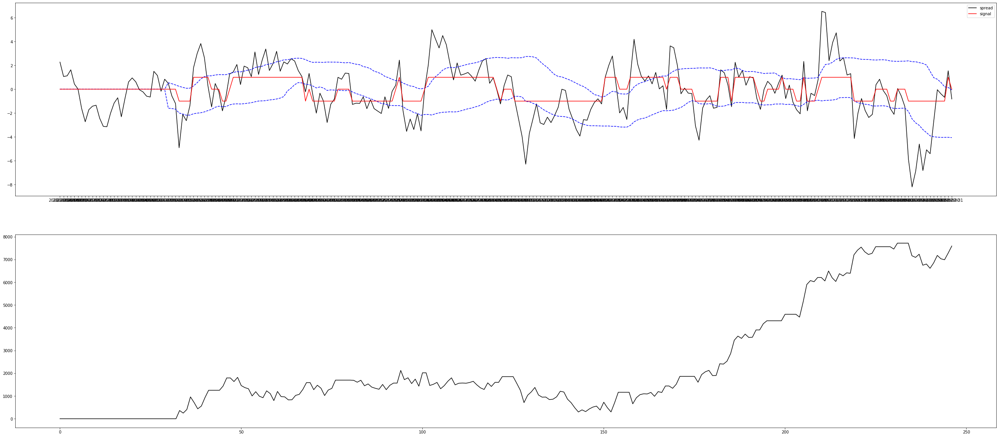

In [260]:
'''
Example of backtest_pair function on a statistically significant cointegrated pairs.
The result is good.
'''


sample_pair = list(possibly_cointegrated_pairs_p_value_dict)[5]
pairs_df, pnl = backtest_pair(sample_pair, show_plot=True)

In [167]:
'''
This part is wrong
I intend to use something like a gridsearchCV in ML to find the optimal hyperparameter of alpha and rolling window
'''


alphas = [0.01, 0.02, 0.03]
windows = [30, 40, 50]

alpha_window_pnl_dict = {}

for alpha in alphas:
    for window in windows:
        
        cum_pnl = 0
        pairs_count = 0
        
        for pair in possibly_cointegrated_pairs_p_value_dict:
            if possibly_cointegrated_pairs_p_value_dict[pair] > alpha:
                break
            pairs_df, pnl = backtest_pair(pair, window=window, suppress_output=True)
            pairs_count += 1
            cum_pnl += pnl
            
            alpha_window_pnl_dict[(alpha, window)] = cum_pnl
            
        print("Alpha: %s; Window: %s" % (alpha, window))
        print("Total number of pairs traded: %d" % pairs_count)
        print("Total Cumulative P/L: %d" % cum_pnl)
            
#alpha = 0.01
#window=30 -> pnl=112148; window=50 -> pnl=155276; window=40 -> 119351

#alpha=0.02
#window=30 -> pnl=142815; window=40 -> pnl=160885; window=50 -> 201344

Alpha: 0.01; Window: 30
Total number of pairs traded: 94
Total Cumulative P/L: 112148
Alpha: 0.01; Window: 40
Total number of pairs traded: 94
Total Cumulative P/L: 119351
Alpha: 0.01; Window: 50
Total number of pairs traded: 94
Total Cumulative P/L: 155276
Alpha: 0.02; Window: 30
Total number of pairs traded: 154
Total Cumulative P/L: 142815
Alpha: 0.02; Window: 40
Total number of pairs traded: 154
Total Cumulative P/L: 160885
Alpha: 0.02; Window: 50
Total number of pairs traded: 154
Total Cumulative P/L: 201344
Alpha: 0.03; Window: 30
Total number of pairs traded: 227
Total Cumulative P/L: 201292
Alpha: 0.03; Window: 40
Total number of pairs traded: 227
Total Cumulative P/L: 227830
Alpha: 0.03; Window: 50
Total number of pairs traded: 227
Total Cumulative P/L: 273841


In [169]:
'''
Cumulative PnL with optimal parameter found in the cell above
'''


alphas = [0.05]
windows = [50]

for alpha in alphas:
    for window in windows:
        
        cum_pnl = 0
        pairs_count = 0
        
        for pair in possibly_cointegrated_pairs_p_value_dict:
            if possibly_cointegrated_pairs_p_value_dict[pair] > alpha:
                break
            pairs_df, pnl = backtest_pair(pair, window=window)
            pairs_count += 1
            cum_pnl += pnl
                        
        print("Alpha: %s; Window: %s" % (alpha, window))
        print("Total number of pairs traded: %d" % pairs_count)
        print("Total Cumulative P/L: %d" % cum_pnl)
            

Cumulative P/L for pair WYNN MACAU-SINOPHARM: 3020
Cumulative P/L for pair CLP HOLDINGS-CHINA SHENHUA: -958
Cumulative P/L for pair CLP HOLDINGS-MINSHENG BANK: -2405
Cumulative P/L for pair CHINA VANKE-GAC GROUP: -124
Cumulative P/L for pair WEICHAI POWER-CGS: 4609
Cumulative P/L for pair AIA-LENOVO GROUP: 5034
Cumulative P/L for pair CITIC BANK-PICC P&C: 1059
Cumulative P/L for pair CLP HOLDINGS-CITIC SEC: 2353
Cumulative P/L for pair CNOOC-SINOPHARM: 438
Cumulative P/L for pair AIR CHINA-GAC GROUP: -4576
Cumulative P/L for pair COUNTRY GARDEN-KUNLUN ENERGY: 3805
Cumulative P/L for pair CLP HOLDINGS-CHINA RES GAS: 1761
Cumulative P/L for pair CHINA TAIPING-PICC GROUP: 319
Cumulative P/L for pair WEICHAI POWER-NCI: 259
Cumulative P/L for pair CLP HOLDINGS-WEICHAI POWER: 2175
Cumulative P/L for pair BRILLIANCE CHI-HTSC: 6538
Cumulative P/L for pair CHINA TAIPING-ASM PACIFIC: 5890
Cumulative P/L for pair NEWWORLDDEV-NEW-KUNLUN ENERGY: -685
Cumulative P/L for pair WH GROUP-CITIC BANK: 575

Cumulative P/L for pair ABC-GUANGDONG INV: -1394
Cumulative P/L for pair KWG GROUP-CICC: 3012
Cumulative P/L for pair WH GROUP-LINK REIT: 1463
Cumulative P/L for pair ICBC-CK ASSET: -1964
Cumulative P/L for pair PETROCHINA-HAITONG SEC: -2615
Cumulative P/L for pair MTR CORPORATION-CPIC: -2032
Cumulative P/L for pair BUD APAC-SJM HOLDINGS: -2841
Cumulative P/L for pair NEWWORLDDEV-NEW-CHINA SHENHUA: -576
Cumulative P/L for pair BOC HONG KONG-LINK REIT: -138
Cumulative P/L for pair KWG GROUP-CHINA DONGXIANG: 6691
Cumulative P/L for pair CHINA RES LAND-NEWWORLDDEV-NEW: 3227
Cumulative P/L for pair AIA-CMOC: -950
Cumulative P/L for pair CCB-LINK REIT: -2482
Cumulative P/L for pair COUNTRY GARDEN-NEWWORLDDEV-NEW: 1385
Cumulative P/L for pair HENGAN INT'L-GREENTOWN SER: -133
Cumulative P/L for pair PICC GROUP-CRRC TIMES ELEC: 5709
Cumulative P/L for pair NEWWORLDDEV-NEW-KWG GROUP: 2145
Cumulative P/L for pair COUNTRY GARDEN-CIFI HOLD GP: 1023
Cumulative P/L for pair WYNN MACAU-HAITONG SEC: -

Cumulative P/L for pair HANG SENG BANK-HK & CHINA GAS: 865
Cumulative P/L for pair GEELY AUTO-FUYAO GLASS: 1793
Cumulative P/L for pair CCB-CSPC PHARMA: 90
Cumulative P/L for pair AIA-PING AN: 1656
Cumulative P/L for pair CHINA MOBILE-CHINA OVERSEAS: 1457
Cumulative P/L for pair PETROCHINA-CHINA TAIPING: -1590
Cumulative P/L for pair MTR CORPORATION-CONCH CEMENT: 670
Cumulative P/L for pair COUNTRY GARDEN-CHINA JINMAO: 3829
Cumulative P/L for pair BUD APAC-CHINA LIFE: -764
Cumulative P/L for pair CHINA RES LAND-BANK OF CHINA: -190
Cumulative P/L for pair SANDS CHINA LTD-AIR CHINA: 5496
Cumulative P/L for pair BANK OF CHINA-CHINA TOWER: -233
Cumulative P/L for pair COUNTRY GARDEN-LINK REIT: -2523
Cumulative P/L for pair CCB-GUANGDONG INV: -2189
Cumulative P/L for pair CHINA VANKE-BEIJING ENT: 4432
Cumulative P/L for pair CHINA LIFE-CITIC SEC: 4195
Cumulative P/L for pair SJM HOLDINGS-KWG GROUP: -2658
Cumulative P/L for pair BUD APAC-MINSHENG BANK: -561
Cumulative P/L for pair CCB-3SBIO:

In [164]:
'''
unfinished: this part aims to get the test_pairs_list for submission
'''

alpha = 0.001
test_pairs_list = []
pairs_count = 0
cum_pnl = 0

for pair in possibly_cointegrated_pairs_p_value_dict:
    if possibly_cointegrated_pairs_p_value_dict[pair] > alpha:
        break
    mergedData = pd.concat([researchData, testData], axis=0)
    pairs_df, pnl = backtest_pair(pair, close_df=mergedData, suppress_output=True)
    test_pairs_list.append(pairs_df[pairs_df.Date.isin(testData.index)].reset_index().drop(labels="index", axis=1))

    pairs_count += 1
    cum_pnl += pnl
    
print()
print("Total number of pairs traded: %d" % pairs_count)
print("Total Cumulative P/L: %d" % cum_pnl)
    
test_pairs_list[0]


Total number of pairs traded: 12
Total Cumulative P/L: 11148


,Date,WYNN MACAU,SINOPHARM,signal,dollarValue
0,2021-01-04,12.96,18.367226,-1,10000
1,2021-01-05,12.90,18.231747,-1,10000
2,2021-01-06,13.04,18.386581,-1,10000
3,2021-01-07,12.92,18.038202,0,10000
4,2021-01-08,12.80,17.786596,0,10000
...,...,...,...,...,...
178,2021-09-21,6.22,20.799999,-1,10000
179,2021-09-23,6.43,20.700001,0,10000
180,2021-09-24,6.45,20.250000,0,10000
181,2021-09-27,6.16,20.150000,0,10000


In [303]:
'''
This function is same as the pairs selection process above:
First filter with NPD, and then proceed with formal adf test
'''

def getCointegratedPairs(close_df, adf_alpha=0.05, npd_quantile=0.1):
    
    cointegrated_pairs = []
    
    normalised_close_df = pd.DataFrame()
    npd_df = pd.DataFrame(columns=close_df.columns, index=close_df.columns, dtype="float").fillna(0.0)

    for stock in close_df.columns:
        normalised_close_df[stock] = close_df[stock]/close_df[stock][0]
    for pair in product(normalised_close_df.columns, repeat=2):
        npd = ((normalised_close_df[pair[0]]-normalised_close_df[pair[1]])**2).sum()
        npd_df[pair[0]][pair[1]] = npd
    
    npd_df[npd_df == 0] = np.NaN
    npd_threshold = np.nanquantile(npd_df, npd_quantile)

    for pair1_idx in range(len(npd_df)):
        for pair2_idx in range(pair1_idx+1, len(npd_df)):
            if npd_df.iloc[pair1_idx, pair2_idx] <= npd_threshold:
                
                pair1 = npd_df.columns[pair1_idx]
                pair2 = npd_df.columns[pair2_idx]
        
                ols = OLS(close_df[pair1], sm.add_constant(close_df[pair2].to_numpy()), missing="drop").fit()
                intercept = ols.params[0]
                slope = ols.params[1]
                residuals = close_df[pair1] - (intercept + slope * close_df[pair2])

                adf = adfuller(residuals[~np.isnan(residuals)])
                p_value = adf[1]

                if p_value < adf_alpha:
                    cointegrated_pairs.append((pair1, pair2))
                else:
                    continue

    return cointegrated_pairs

In [396]:
'''
Since I made a lookahead bias in the previous cells, I try to modify my strategy here
The testData is split into intervals of 30 days (rolling_window). In each interval, I use the previous 30 days data
to get the cointegrated pairs. 
Then, I assume the pairs are going to be cointegrated in the upcoming 30 days 
(i know this assumption is wrong, but still it should not be very critical) and trade with the logic above
(assume spread calculated from kalman filter is normal and mean reverting)

However, when I deploy the strategy into testData, significant loss is incurred. (not sure why)
'''


mergedData = pd.concat([researchData, testData], axis=0)

rolling_window = 30

for idx in range(len(researchData), len(mergedData), rolling_window):
    
    total_pnl = 0
    
    recent_close_df = mergedData[idx-rolling_window:idx]
    trading_close_df = mergedData[idx:idx+rolling_window]
    cointegrated_pairs = getCointegratedPairs(recent_close_df, adf_alpha=0.0001)
    
    for pair in cointegrated_pairs:
        pairs_df, cum_pnl = backtest_pair(pair, close_df=mergedData[idx-rolling_window: idx+rolling_window],
                                          window=rolling_window)
        total_pnl += list(cum_pnl.values())[-1]
    print(total_pnl)
    break

248
MEITUAN-W NEWWORLDDEV-NEW
Cumulative P/L for pair MEITUAN-W-NEWWORLDDEV-NEW: -1570
SHK PPT CHINA JINMAO
Cumulative P/L for pair SHK PPT-CHINA JINMAO: 211
GALAXY ENT PICC P&C
Cumulative P/L for pair GALAXY ENT-PICC P&C: -1180
HK & CHINA GAS NCI
Cumulative P/L for pair HK & CHINA GAS-NCI: -625
TECHTRONIC IND ND PAPER
Cumulative P/L for pair TECHTRONIC IND-ND PAPER: 4843
CHINA LIFE SJM HOLDINGS
Cumulative P/L for pair CHINA LIFE-SJM HOLDINGS: -1650
ZHONGSHENG HLDG WEICHAI POWER
Cumulative P/L for pair ZHONGSHENG HLDG-WEICHAI POWER: 353
WH GROUP AIR CHINA
Cumulative P/L for pair WH GROUP-AIR CHINA: -1821
WYNN MACAU SJM HOLDINGS
Cumulative P/L for pair WYNN MACAU-SJM HOLDINGS: 1202
CONCH VENTURE LINK REIT
Cumulative P/L for pair CONCH VENTURE-LINK REIT: -765
TSINGTAO BREW GREENTOWN SER
Cumulative P/L for pair TSINGTAO BREW-GREENTOWN SER: 1155
CHINA SHENHUA LINK REIT
Cumulative P/L for pair CHINA SHENHUA-LINK REIT: -1867
CITIC SEC CGS
Cumulative P/L for pair CITIC SEC-CGS: 525
-1190.4726